# Rainfall Weather Forecasting

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('C:/Users/jdjra/OneDrive/Desktop/Internship/evaluation projects/3rd phase/rainfall.csv')

In [3]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [5]:
df['Date'] = pd.to_datetime(df['Date'])
df['Month'] = df['Date'].dt.month
df['Month']

0       12
1       12
2       12
3       12
4       12
        ..
8420     6
8421     6
8422     6
8423     6
8424     6
Name: Month, Length: 8425, dtype: int64

In [6]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,12
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,12
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,12
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,12
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No,6
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No,6
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No,6
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No,6


In [7]:
df=df.drop(['Date'],axis=1)

In [8]:
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,12
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,12
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,12
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,12
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,...,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No,6
8421,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,...,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No,6
8422,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,...,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No,6
8423,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,...,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No,6


In [9]:
df.columns.tolist()

['Location',
 'MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustDir',
 'WindGustSpeed',
 'WindDir9am',
 'WindDir3pm',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'RainToday',
 'RainTomorrow',
 'Month']

In [10]:
df.isna().sum()

Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
Month               0
dtype: int64

In [11]:
df.dropna(subset=['RainTomorrow'],inplace=True)

In [12]:
catcols=[]
numcols=[]

for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        catcols.append(i)
    else:
        numcols.append(i)

In [13]:
catcols

['Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

In [14]:
numcols

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'Month']

<Axes: >

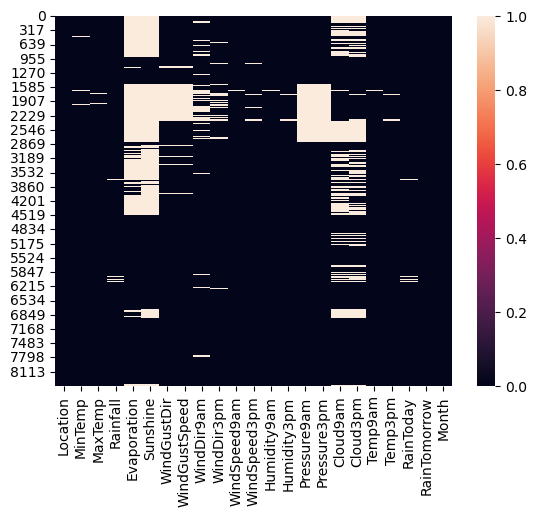

In [15]:
sns.heatmap(df.isna())

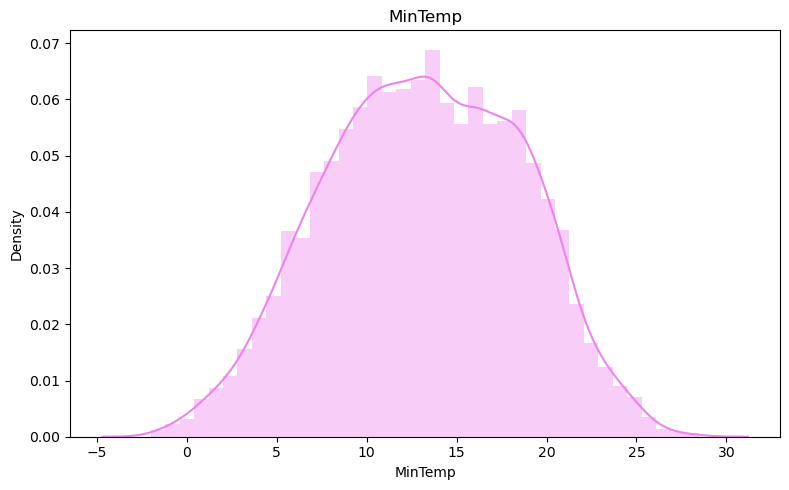

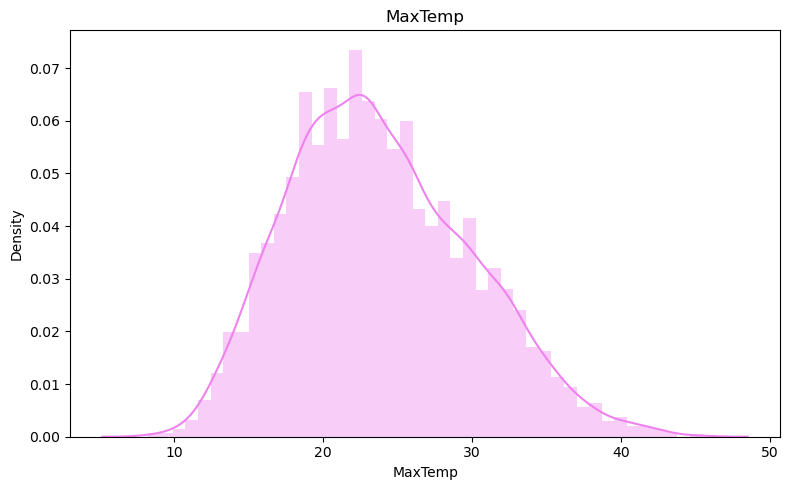

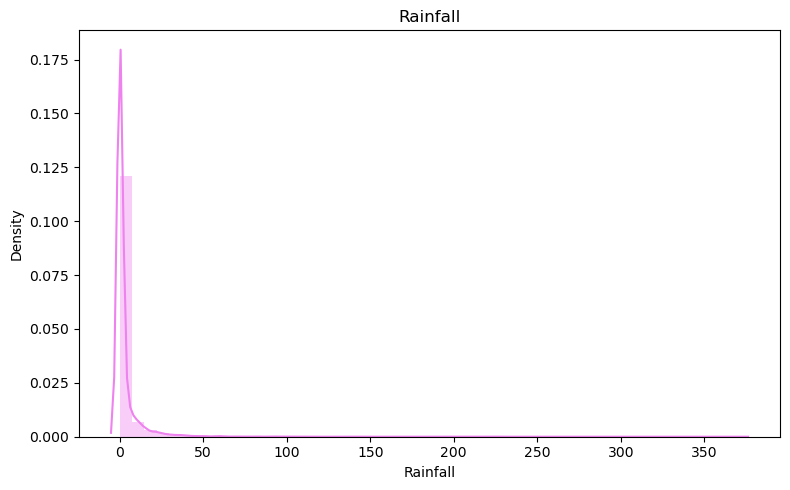

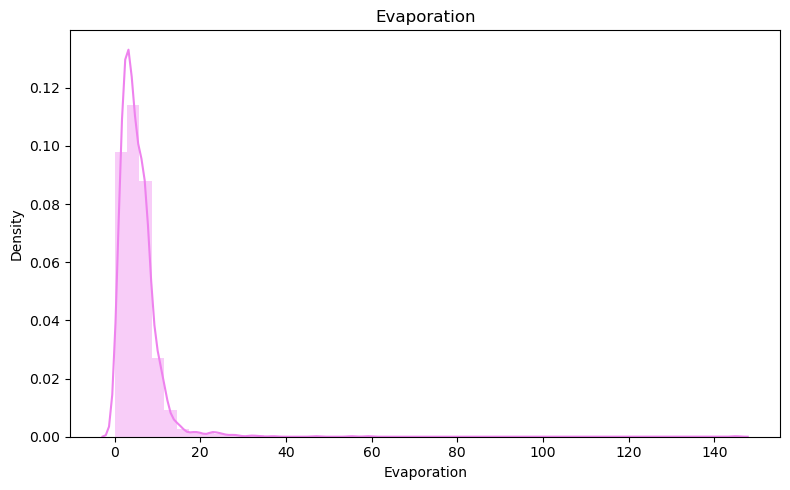

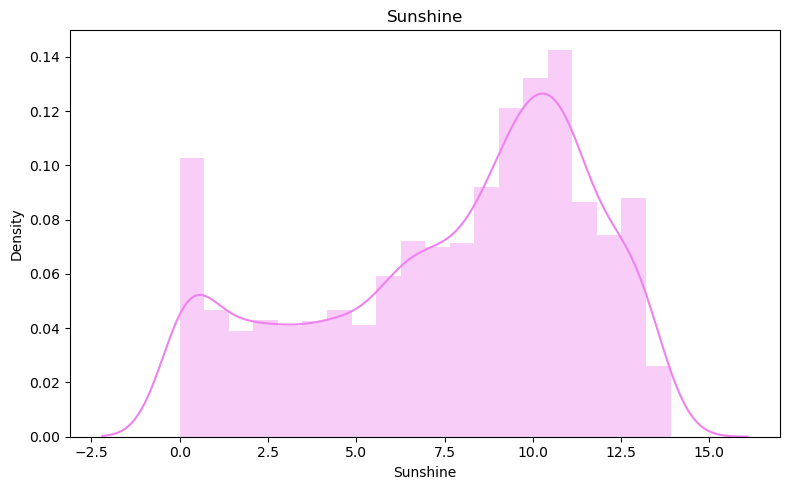

...

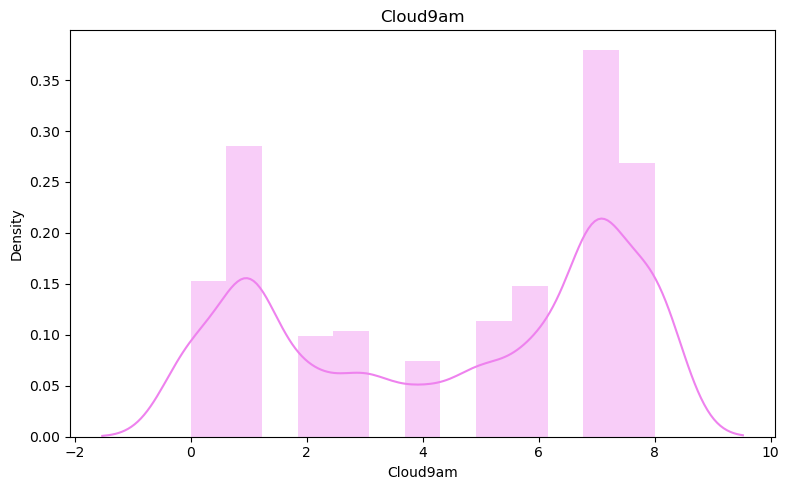

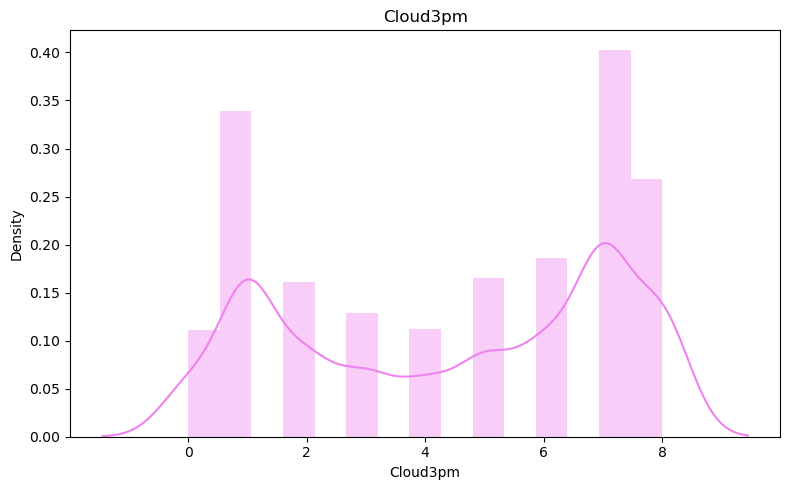

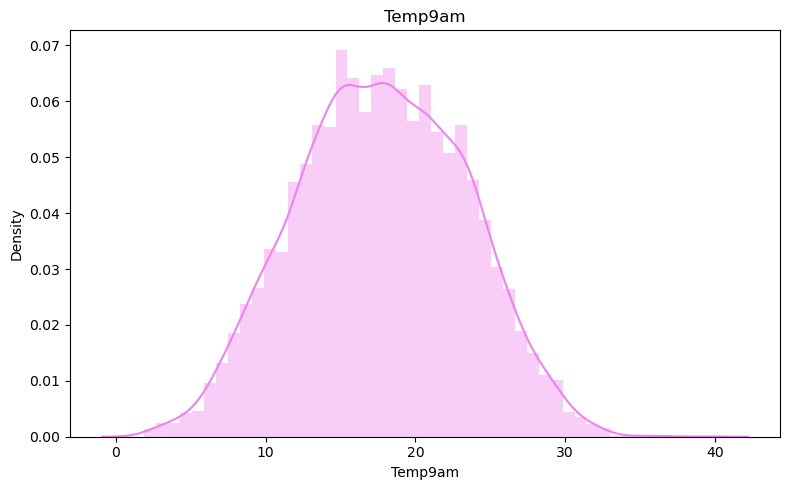

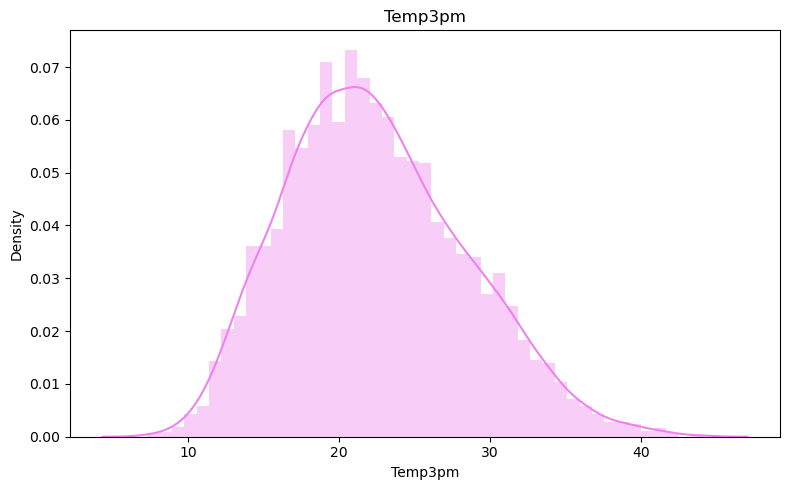

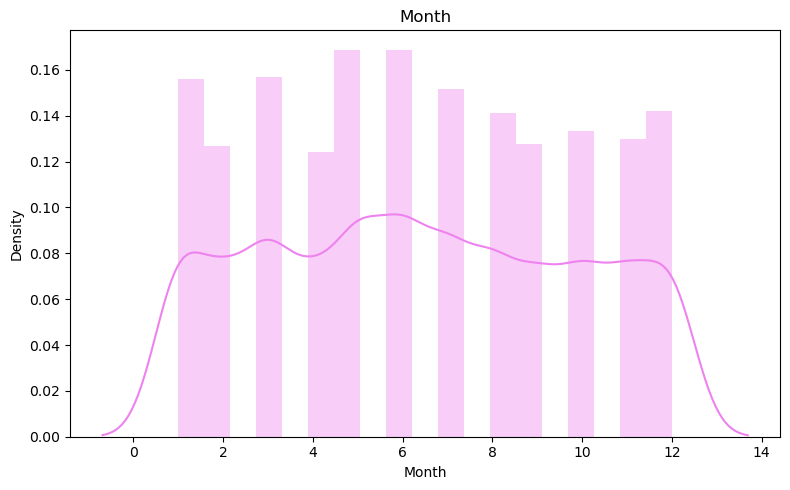

In [16]:
for i in numcols:
  plt.figure(figsize=(8,5))
  sns.distplot(df[i],color='violet')
  plt.title(i)
  plt.tight_layout()
  plt.show()

1. Rainfall,Sunshine,Evaporation,WindGustSpeed,WindSpeed9am are not uniformly distributed.
2. Rest of the data is symmetric.

In [17]:
symmetric_missing=['MinTemp',
 'MaxTemp',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm']

In [18]:
for i in symmetric_missing:
    df[i].fillna(df[i].mean(), inplace=True)

In [19]:
skewed_missing=['Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am']

In [20]:
for i in skewed_missing:
    df[i].fillna(df[i].median(), inplace=True)

In [21]:
df.isna().sum()

Location           0
MinTemp            0
MaxTemp            0
Rainfall           0
Evaporation        0
Sunshine           0
WindGustDir      953
WindGustSpeed      0
WindDir9am       809
WindDir3pm       286
WindSpeed9am       0
WindSpeed3pm       0
Humidity9am        0
Humidity3pm        0
Pressure9am        0
Pressure3pm        0
Cloud9am           0
Cloud3pm           0
Temp9am            0
Temp3pm            0
RainToday        107
RainTomorrow       0
Month              0
dtype: int64

In [22]:
cat_missing=['WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday']

In [23]:
for i in cat_missing:
    mode_val=df[i].mode()[0]
    df[i].fillna(mode_val,inplace=True)

In [24]:
df.isna().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Month            0
dtype: int64

# EDA

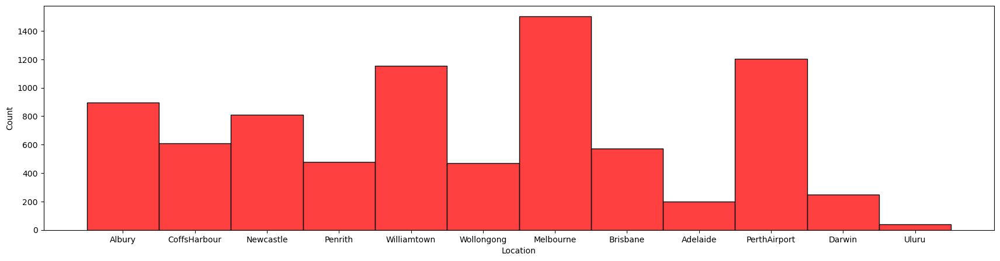

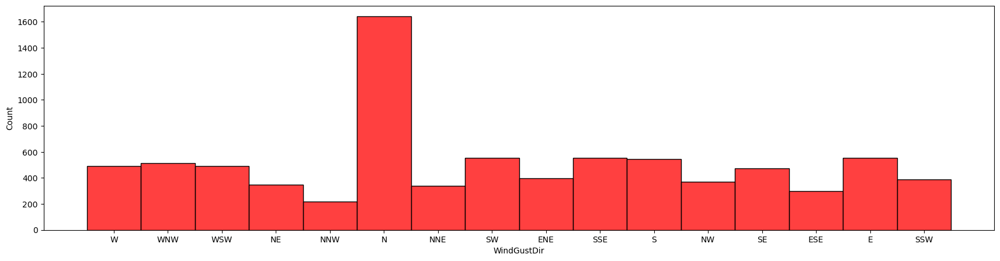

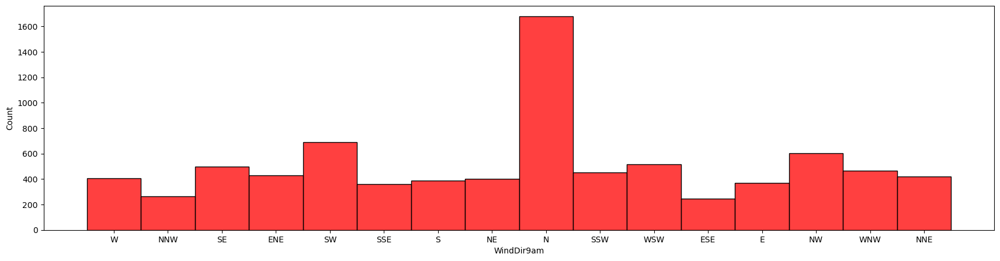

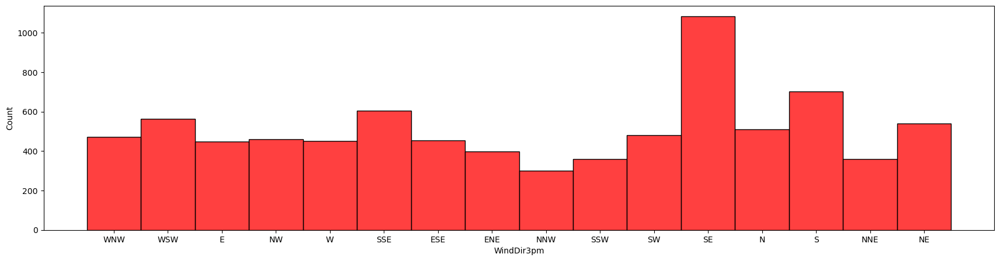

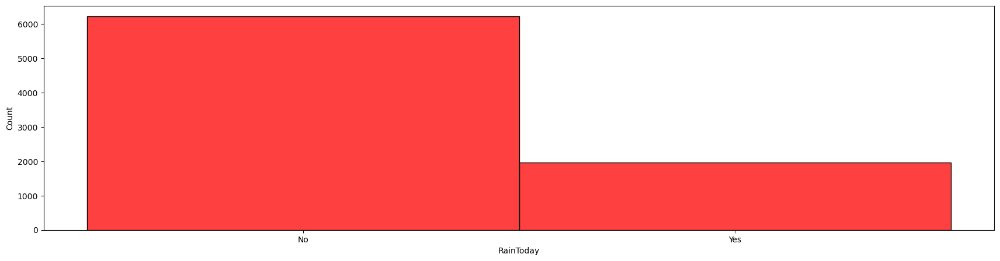

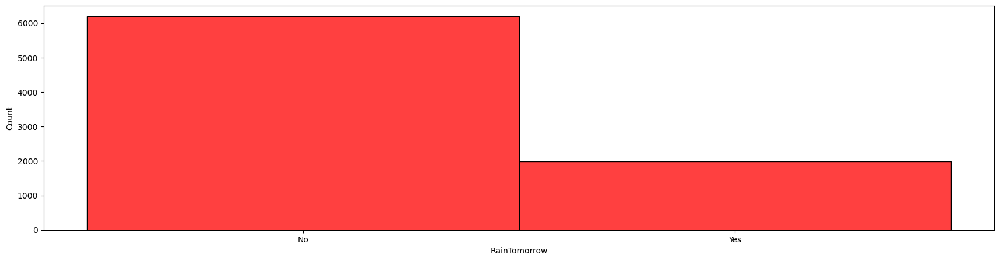

In [25]:
for i in catcols:
    plt.figure(figsize=(21,5))
    sns.histplot(df[i],color='red')
    plt.show()

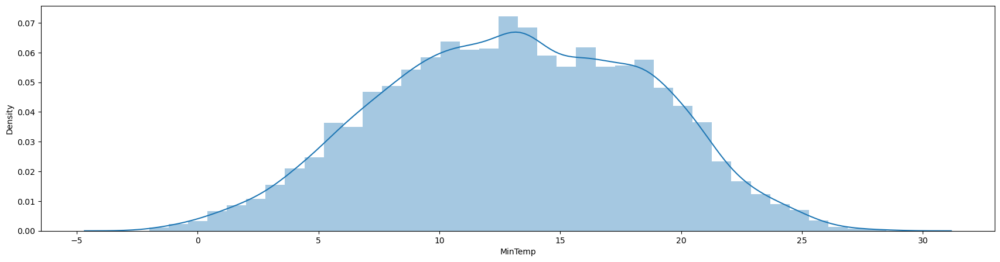

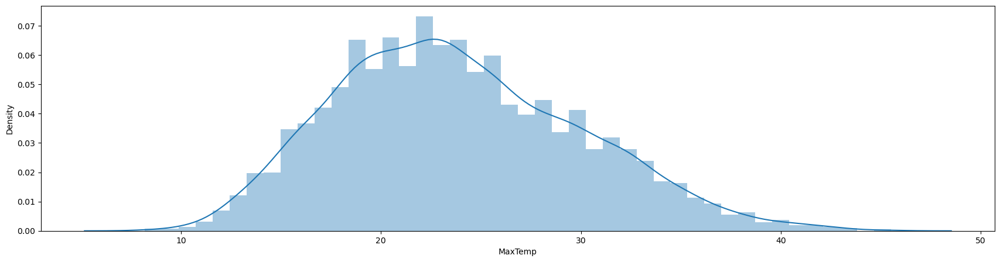

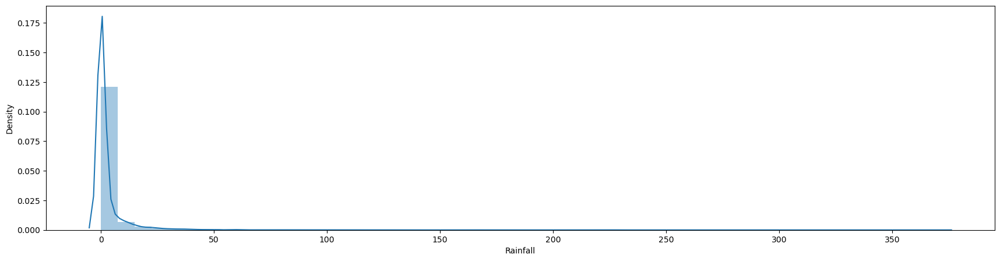

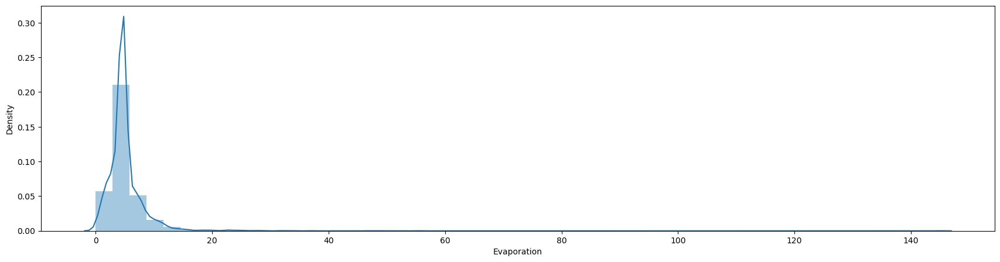

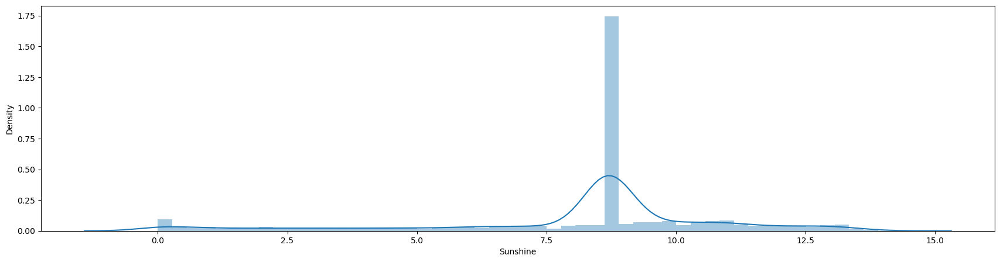

...

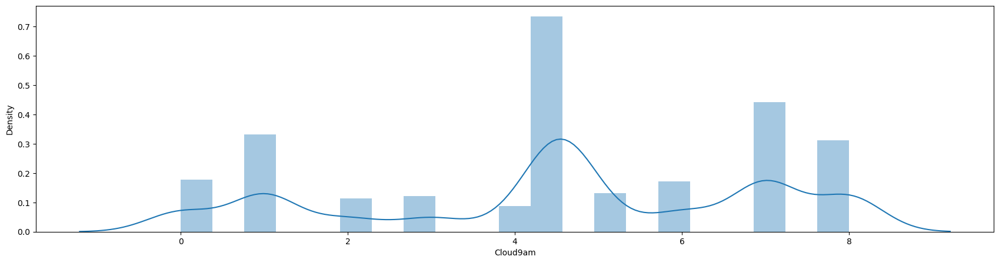

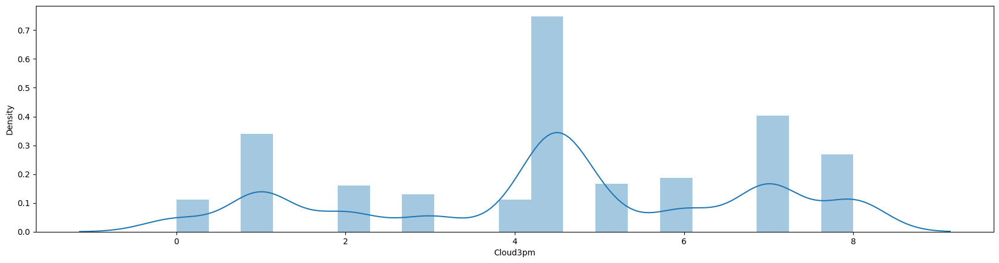

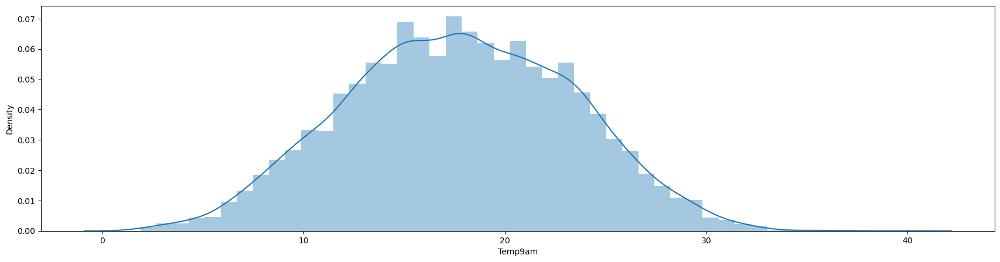

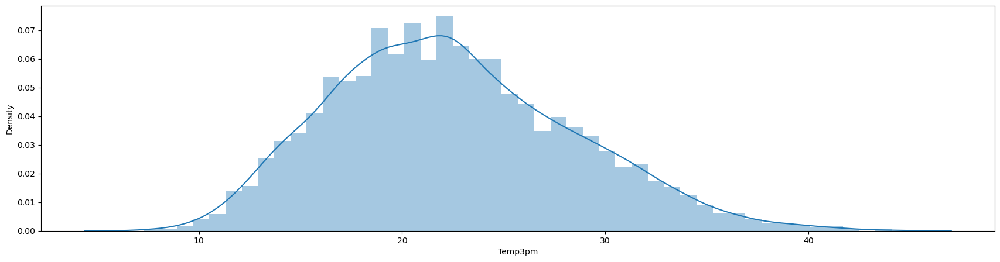

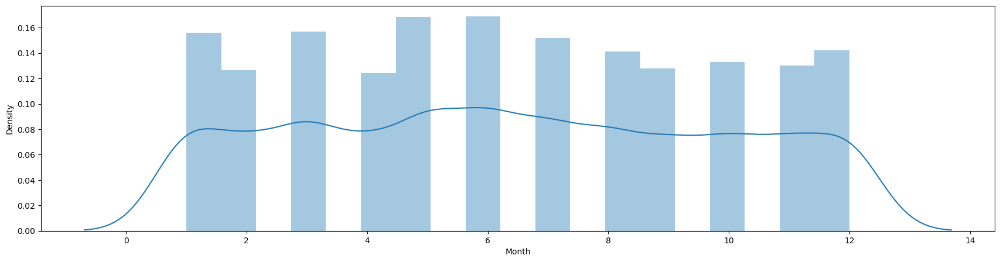

In [26]:
for i in numcols:
  plt.figure(figsize=(21,5))
  sns.distplot(df[i])
  plt.show()

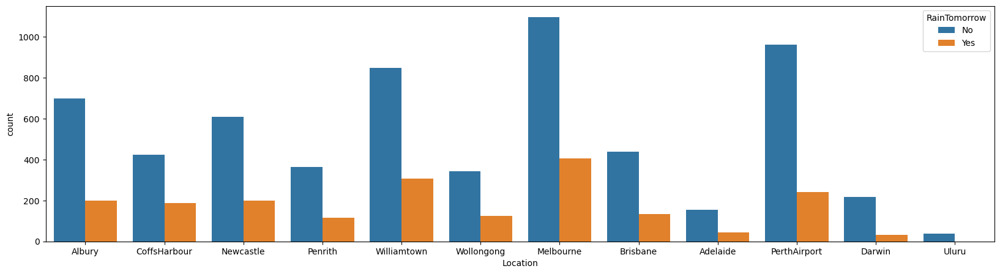

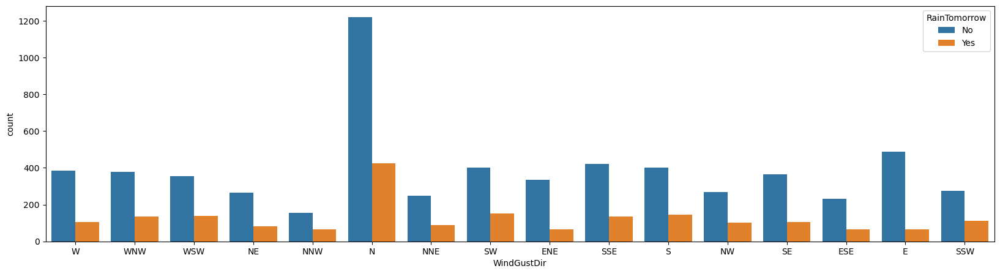

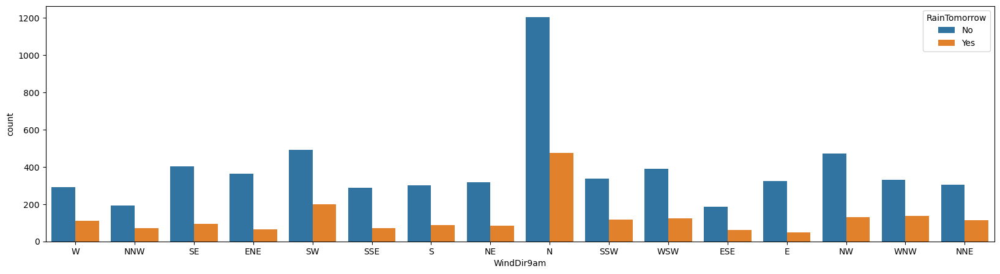

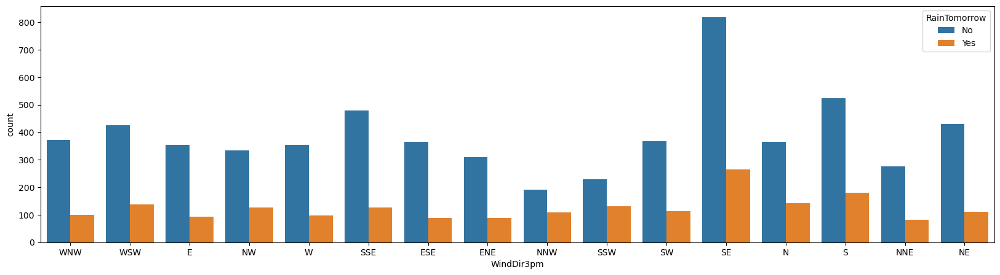

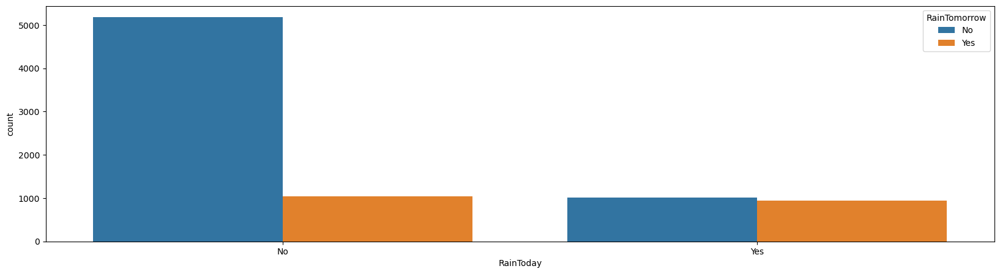

In [27]:
for i in catcols[:-1]:
  plt.figure(figsize=(20,5))
  sns.countplot(x=i,hue=df['RainTomorrow'],data=df)
  plt.show()

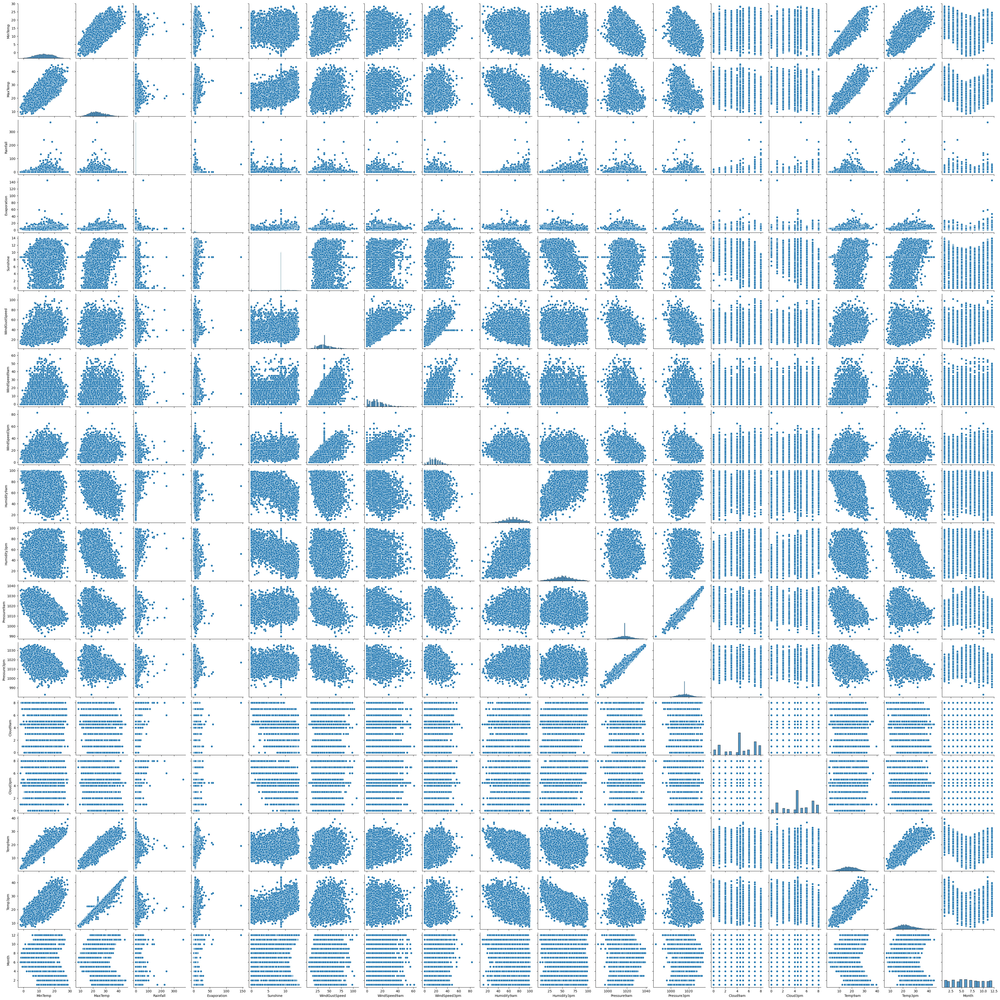

In [28]:
sns.pairplot(df)

In [29]:
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month
0,Albury,13.4,22.9,0.6,4.6,8.7,W,44.0,W,WNW,...,22.0,1007.7,1007.1,8.000000,4.483177,16.9,21.8,No,No,12
1,Albury,7.4,25.1,0.0,4.6,8.7,WNW,44.0,NNW,WSW,...,25.0,1010.6,1007.8,4.528075,4.483177,17.2,24.3,No,No,12
2,Albury,12.9,25.7,0.0,4.6,8.7,WSW,46.0,W,WSW,...,30.0,1007.6,1008.7,4.528075,2.000000,21.0,23.2,No,No,12
3,Albury,9.2,28.0,0.0,4.6,8.7,NE,24.0,SE,E,...,16.0,1017.6,1012.8,4.528075,4.483177,18.1,26.5,No,No,12
4,Albury,17.5,32.3,1.0,4.6,8.7,W,41.0,ENE,NW,...,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8419,Uluru,3.5,21.8,0.0,4.6,8.7,E,31.0,ESE,E,...,27.0,1024.7,1021.2,4.528075,4.483177,9.4,20.9,No,No,6
8420,Uluru,2.8,23.4,0.0,4.6,8.7,E,31.0,SE,ENE,...,24.0,1024.6,1020.3,4.528075,4.483177,10.1,22.4,No,No,6
8421,Uluru,3.6,25.3,0.0,4.6,8.7,NNW,22.0,SE,N,...,21.0,1023.5,1019.1,4.528075,4.483177,10.9,24.5,No,No,6
8422,Uluru,5.4,26.9,0.0,4.6,8.7,N,37.0,SE,WNW,...,24.0,1021.0,1016.8,4.528075,4.483177,12.5,26.1,No,No,6


In [30]:
from sklearn.preprocessing import LabelEncoder
label=LabelEncoder()

In [31]:
for i in catcols:
    df[i]=label.fit_transform(df[i])

In [32]:
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month
0,1,13.4,22.9,0.6,4.6,8.7,13,44.0,13,14,...,22.0,1007.7,1007.1,8.000000,4.483177,16.9,21.8,0,0,12
1,1,7.4,25.1,0.0,4.6,8.7,14,44.0,6,15,...,25.0,1010.6,1007.8,4.528075,4.483177,17.2,24.3,0,0,12
2,1,12.9,25.7,0.0,4.6,8.7,15,46.0,13,15,...,30.0,1007.6,1008.7,4.528075,2.000000,21.0,23.2,0,0,12
3,1,9.2,28.0,0.0,4.6,8.7,4,24.0,9,0,...,16.0,1017.6,1012.8,4.528075,4.483177,18.1,26.5,0,0,12
4,1,17.5,32.3,1.0,4.6,8.7,13,41.0,1,7,...,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8419,9,3.5,21.8,0.0,4.6,8.7,0,31.0,2,0,...,27.0,1024.7,1021.2,4.528075,4.483177,9.4,20.9,0,0,6
8420,9,2.8,23.4,0.0,4.6,8.7,0,31.0,9,1,...,24.0,1024.6,1020.3,4.528075,4.483177,10.1,22.4,0,0,6
8421,9,3.6,25.3,0.0,4.6,8.7,6,22.0,9,3,...,21.0,1023.5,1019.1,4.528075,4.483177,10.9,24.5,0,0,6
8422,9,5.4,26.9,0.0,4.6,8.7,3,37.0,9,14,...,24.0,1021.0,1016.8,4.528075,4.483177,12.5,26.1,0,0,6


In [33]:
df['RainTomorrow'].value_counts()

0    6195
1    1991
Name: RainTomorrow, dtype: int64

In [34]:
df['Rainfall'].value_counts()

0.0      5341
0.2       404
0.4       177
0.6       112
1.4        84
         ... 
128.0       1
90.0        1
34.4        1
33.4        1
40.0        1
Name: Rainfall, Length: 250, dtype: int64

In [35]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()

In [36]:
x1=df.drop(['RainTomorrow'],axis=1)
y1=df['RainTomorrow']

In [37]:
x1

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Month
0,1,13.4,22.9,0.6,4.6,8.7,13,44.0,13,14,...,71.0,22.0,1007.7,1007.1,8.000000,4.483177,16.9,21.8,0,12
1,1,7.4,25.1,0.0,4.6,8.7,14,44.0,6,15,...,44.0,25.0,1010.6,1007.8,4.528075,4.483177,17.2,24.3,0,12
2,1,12.9,25.7,0.0,4.6,8.7,15,46.0,13,15,...,38.0,30.0,1007.6,1008.7,4.528075,2.000000,21.0,23.2,0,12
3,1,9.2,28.0,0.0,4.6,8.7,4,24.0,9,0,...,45.0,16.0,1017.6,1012.8,4.528075,4.483177,18.1,26.5,0,12
4,1,17.5,32.3,1.0,4.6,8.7,13,41.0,1,7,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8419,9,3.5,21.8,0.0,4.6,8.7,0,31.0,2,0,...,59.0,27.0,1024.7,1021.2,4.528075,4.483177,9.4,20.9,0,6
8420,9,2.8,23.4,0.0,4.6,8.7,0,31.0,9,1,...,51.0,24.0,1024.6,1020.3,4.528075,4.483177,10.1,22.4,0,6
8421,9,3.6,25.3,0.0,4.6,8.7,6,22.0,9,3,...,56.0,21.0,1023.5,1019.1,4.528075,4.483177,10.9,24.5,0,6
8422,9,5.4,26.9,0.0,4.6,8.7,3,37.0,9,14,...,53.0,24.0,1021.0,1016.8,4.528075,4.483177,12.5,26.1,0,6


In [38]:
y1

0       0
1       0
2       0
3       0
4       0
       ..
8419    0
8420    0
8421    0
8422    0
8423    0
Name: RainTomorrow, Length: 8186, dtype: int32

In [39]:
x2=df.drop(['Rainfall'],axis=1)
y2=df['Rainfall']

In [40]:
x2

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month
0,1,13.4,22.9,4.6,8.7,13,44.0,13,14,20.0,...,22.0,1007.7,1007.1,8.000000,4.483177,16.9,21.8,0,0,12
1,1,7.4,25.1,4.6,8.7,14,44.0,6,15,4.0,...,25.0,1010.6,1007.8,4.528075,4.483177,17.2,24.3,0,0,12
2,1,12.9,25.7,4.6,8.7,15,46.0,13,15,19.0,...,30.0,1007.6,1008.7,4.528075,2.000000,21.0,23.2,0,0,12
3,1,9.2,28.0,4.6,8.7,4,24.0,9,0,11.0,...,16.0,1017.6,1012.8,4.528075,4.483177,18.1,26.5,0,0,12
4,1,17.5,32.3,4.6,8.7,13,41.0,1,7,7.0,...,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8419,9,3.5,21.8,4.6,8.7,0,31.0,2,0,15.0,...,27.0,1024.7,1021.2,4.528075,4.483177,9.4,20.9,0,0,6
8420,9,2.8,23.4,4.6,8.7,0,31.0,9,1,13.0,...,24.0,1024.6,1020.3,4.528075,4.483177,10.1,22.4,0,0,6
8421,9,3.6,25.3,4.6,8.7,6,22.0,9,3,13.0,...,21.0,1023.5,1019.1,4.528075,4.483177,10.9,24.5,0,0,6
8422,9,5.4,26.9,4.6,8.7,3,37.0,9,14,9.0,...,24.0,1021.0,1016.8,4.528075,4.483177,12.5,26.1,0,0,6


In [41]:
y2

0       0.6
1       0.0
2       0.0
3       0.0
4       1.0
       ... 
8419    0.0
8420    0.0
8421    0.0
8422    0.0
8423    0.0
Name: Rainfall, Length: 8186, dtype: float64

In [42]:
x_1=scaler.fit_transform(x1)
x1=pd.DataFrame(x_1,columns=x1.columns)
x1

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Month
0,-1.505551,0.046519,-0.154339,-0.207836,-0.121162,0.185771,1.229770,0.296606,1.252839,1.397691,...,0.193923,-1.591645,-1.596808,-1.322191,1.420460,0.000000,-0.150540,-0.106358,-0.56089,1.643604
1,-1.505551,-1.064573,0.205984,-0.265414,-0.121162,0.185771,1.442062,0.296606,-0.273994,1.623299,...,-1.413150,-1.427994,-1.134310,-1.209387,0.000000,0.000000,-0.097091,0.314937,-0.56089,1.643604
2,-1.505551,-0.046072,0.304254,-0.265414,-0.121162,0.185771,1.654355,0.441966,1.252839,1.623299,...,-1.770278,-1.155241,-1.612756,-1.064355,0.000000,-1.074860,0.579938,0.129567,-0.56089,1.643604
3,-1.505551,-0.731246,0.680955,-0.265414,-0.121162,0.185771,-0.680860,-1.156992,0.380363,-1.760825,...,-1.353629,-1.918948,-0.017935,-0.403650,0.000000,0.000000,0.063258,0.685677,-0.56089,1.643604
4,-1.505551,0.805765,1.385222,-0.169452,-0.121162,0.185771,1.229770,0.078566,-1.364590,-0.181567,...,0.848656,-0.991590,-1.102414,-1.499453,1.011333,1.522281,0.009808,1.224935,-0.56089,1.643604
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8181,1.018462,-1.786783,-0.334501,-0.265414,-0.121162,0.185771,-1.530029,-0.648233,-1.146471,-1.760825,...,-0.520332,-1.318893,1.114387,0.949990,0.000000,0.000000,-1.486781,-0.258024,-0.56089,-0.114968
8182,1.018462,-1.916411,-0.072448,-0.265414,-0.121162,0.185771,-1.530029,-0.648233,0.380363,-1.535216,...,-0.996502,-1.482544,1.098439,0.804957,0.000000,0.000000,-1.362065,-0.005247,-0.56089,-0.114968
8183,1.018462,-1.768265,0.238740,-0.265414,-0.121162,0.185771,-0.256276,-1.302352,0.380363,-1.084000,...,-0.698896,-1.646196,0.923009,0.611580,0.000000,0.000000,-1.219533,0.348641,-0.56089,-0.114968
8184,1.018462,-1.434938,0.500793,-0.265414,-0.121162,0.185771,-0.893152,-0.212153,0.380363,1.397691,...,-0.877459,-1.482544,0.524304,0.240940,0.000000,0.000000,-0.934468,0.618270,-0.56089,-0.114968


In [43]:
x_2=scaler.fit_transform(x2)
x2=pd.DataFrame(x_2,columns=x2.columns)
x2

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month
0,-1.505551,0.046519,-0.154339,-0.121162,0.185771,1.229770,0.296606,1.252839,1.397691,0.614418,...,-1.591645,-1.596808,-1.322191,1.420460,0.000000,-0.150540,-0.106358,-0.56089,-0.566911,1.643604
1,-1.505551,-1.064573,0.205984,-0.121162,0.185771,1.442062,0.296606,-0.273994,1.623299,-0.966356,...,-1.427994,-1.134310,-1.209387,0.000000,0.000000,-0.097091,0.314937,-0.56089,-0.566911,1.643604
2,-1.505551,-0.046072,0.304254,-0.121162,0.185771,1.654355,0.441966,1.252839,1.623299,0.515620,...,-1.155241,-1.612756,-1.064355,0.000000,-1.074860,0.579938,0.129567,-0.56089,-0.566911,1.643604
3,-1.505551,-0.731246,0.680955,-0.121162,0.185771,-0.680860,-1.156992,0.380363,-1.760825,-0.274767,...,-1.918948,-0.017935,-0.403650,0.000000,0.000000,0.063258,0.685677,-0.56089,-0.566911,1.643604
4,-1.505551,0.805765,1.385222,-0.121162,0.185771,1.229770,0.078566,-1.364590,-0.181567,-0.669961,...,-0.991590,-1.102414,-1.499453,1.011333,1.522281,0.009808,1.224935,-0.56089,-0.566911,1.643604
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8181,1.018462,-1.786783,-0.334501,-0.121162,0.185771,-1.530029,-0.648233,-1.146471,-1.760825,0.120426,...,-1.318893,1.114387,0.949990,0.000000,0.000000,-1.486781,-0.258024,-0.56089,-0.566911,-0.114968
8182,1.018462,-1.916411,-0.072448,-0.121162,0.185771,-1.530029,-0.648233,0.380363,-1.535216,-0.077170,...,-1.482544,1.098439,0.804957,0.000000,0.000000,-1.362065,-0.005247,-0.56089,-0.566911,-0.114968
8183,1.018462,-1.768265,0.238740,-0.121162,0.185771,-0.256276,-1.302352,0.380363,-1.084000,-0.077170,...,-1.646196,0.923009,0.611580,0.000000,0.000000,-1.219533,0.348641,-0.56089,-0.566911,-0.114968
8184,1.018462,-1.434938,0.500793,-0.121162,0.185771,-0.893152,-0.212153,0.380363,1.397691,-0.472364,...,-1.482544,0.524304,0.240940,0.000000,0.000000,-0.934468,0.618270,-0.56089,-0.566911,-0.114968


In [44]:
#Using SMOTE (Synthetic Minority Over-sampling Technique) for oversampling
from imblearn.over_sampling import SMOTE
SM=SMOTE()
x1,y1=SM.fit_resample(x1,y1)

In [45]:
y1.value_counts()

0    6195
1    6195
Name: RainTomorrow, dtype: int64

In [46]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Values'] = [variance_inflation_factor(x1.values, i) for i in range(len(x1.columns))]
vif['Features'] = x1.columns
print(vif)

       Values       Features
0    1.182381       Location
1    9.373729        MinTemp
2   26.588796        MaxTemp
3    1.363795       Rainfall
4    1.221300    Evaporation
5    1.713883       Sunshine
6    1.571115    WindGustDir
7    2.484860  WindGustSpeed
8    1.397698     WindDir9am
9    1.484205     WindDir3pm
10   2.164979   WindSpeed9am
11   2.074616   WindSpeed3pm
12   4.394665    Humidity9am
13   6.679893    Humidity3pm
14  20.003303    Pressure9am
15  18.799089    Pressure3pm
16   2.053680       Cloud9am
17   2.016729       Cloud3pm
18  19.417536        Temp9am
19  35.370100        Temp3pm
20   1.776071      RainToday
21   1.188537          Month


In [47]:
x1=x1.drop(['Temp3pm'],axis=1)

In [48]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Values'] = [variance_inflation_factor(x1.values, i) for i in range(len(x1.columns))]
vif['Features'] = x1.columns
print(vif)

       Values       Features
0    1.181716       Location
1    9.308280        MinTemp
2   10.373970        MaxTemp
3    1.358103       Rainfall
4    1.221296    Evaporation
5    1.712753       Sunshine
6    1.568933    WindGustDir
7    2.467271  WindGustSpeed
8    1.395255     WindDir9am
9    1.482744     WindDir3pm
10   2.162519   WindSpeed9am
11   2.069388   WindSpeed3pm
12   3.745503    Humidity9am
13   4.111861    Humidity3pm
14  19.265550    Pressure9am
15  18.192997    Pressure3pm
16   2.050693       Cloud9am
17   2.009264       Cloud3pm
18  17.803696        Temp9am
19   1.773620      RainToday
20   1.171901          Month


In [49]:
x1=x1.drop(['Pressure9am'],axis=1)

In [50]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Values'] = [variance_inflation_factor(x1.values, i) for i in range(len(x1.columns))]
vif['Features'] = x1.columns
print(vif)

       Values       Features
0    1.181623       Location
1    9.128115        MinTemp
2   10.075125        MaxTemp
3    1.357977       Rainfall
4    1.217673    Evaporation
5    1.712628       Sunshine
6    1.556463    WindGustDir
7    2.448444  WindGustSpeed
8    1.367886     WindDir9am
9    1.385025     WindDir3pm
10   2.162444   WindSpeed9am
11   2.063157   WindSpeed3pm
12   3.745143    Humidity9am
13   4.111655    Humidity3pm
14   1.436516    Pressure3pm
15   2.050639       Cloud9am
16   2.006991       Cloud3pm
17  17.781742        Temp9am
18   1.760563      RainToday
19   1.171421          Month


In [51]:
x1=x1.drop(['Temp9am'],axis=1)

In [52]:
# from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Values'] = [variance_inflation_factor(x1.values, i) for i in range(len(x1.columns))]
vif['Features'] = x1.columns
print(vif)

      Values       Features
0   1.170301       Location
1   4.659166        MinTemp
2   5.698352        MaxTemp
3   1.355727       Rainfall
4   1.217418    Evaporation
5   1.710008       Sunshine
6   1.554082    WindGustDir
7   2.400761  WindGustSpeed
8   1.367804     WindDir9am
9   1.383705     WindDir3pm
10  2.150275   WindSpeed9am
11  2.031852   WindSpeed3pm
12  2.685267    Humidity9am
13  3.265062    Humidity3pm
14  1.431940    Pressure3pm
15  2.034408       Cloud9am
16  2.003412       Cloud3pm
17  1.756526      RainToday
18  1.164322          Month


In [53]:
# from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Values'] = [variance_inflation_factor(x2.values, i) for i in range(len(x2.columns))]
vif['Features'] = x2.columns
print(vif)

       Values       Features
0    1.177135       Location
1    8.483817        MinTemp
2   26.535258        MaxTemp
3    1.196821    Evaporation
4    1.737996       Sunshine
5    1.585084    WindGustDir
6    2.541809  WindGustSpeed
7    1.342044     WindDir9am
8    1.478234     WindDir3pm
9    2.080989   WindSpeed9am
10   1.977444   WindSpeed3pm
11   3.925661    Humidity9am
12   5.749845    Humidity3pm
13  20.534348    Pressure9am
14  19.570757    Pressure3pm
15   1.907647       Cloud9am
16   1.827197       Cloud3pm
17  17.224228        Temp9am
18  33.425883        Temp3pm
19   1.402621      RainToday
20   1.487680   RainTomorrow
21   1.173842          Month


In [54]:
x2=x2.drop(['Temp3pm','Temp9am','Pressure9am'],axis=1)

In [55]:
y2.value_counts()

0.0      5341
0.2       404
0.4       177
0.6       112
1.4        84
         ... 
128.0       1
90.0        1
34.4        1
33.4        1
40.0        1
Name: Rainfall, Length: 250, dtype: int64

In [56]:
# from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Values'] = [variance_inflation_factor(x2.values, i) for i in range(len(x2.columns))]
vif['Features'] = x2.columns
print(vif)

      Values       Features
0   1.162078       Location
1   4.439190        MinTemp
2   5.390644        MaxTemp
3   1.194546    Evaporation
4   1.735491       Sunshine
5   1.566190    WindGustDir
6   2.454795  WindGustSpeed
7   1.321684     WindDir9am
8   1.395163     WindDir3pm
9   2.056798   WindSpeed9am
10  1.925893   WindSpeed3pm
11  2.444448    Humidity9am
12  3.137851    Humidity3pm
13  1.474296    Pressure3pm
14  1.885337       Cloud9am
15  1.813937       Cloud3pm
16  1.384367      RainToday
17  1.483669   RainTomorrow
18  1.148002          Month


# Modeling 1 Rainfall tomorrow prediction

In [57]:
#importing models and libraries
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier,AdaBoostClassifier, BaggingClassifier
from sklearn.metrics import classification_report,confusion_matrix,roc_curve,accuracy_score
from sklearn.model_selection import cross_val_score

In [58]:
maxAccu=0
maxRS=0

for i in range(1,100):
    x1_train,x1_test,y1_train,y1_test=train_test_split(x1,y1,test_size=0.30,random_state=i)
    rfr=RandomForestClassifier()
    rfr.fit(x1_train, y1_train)
    pred=rfr.predict(x1_test)
    acc=accuracy_score(y1_test,pred)
    if acc>maxAccu:
        maxAccu = acc
        maxRs = i
print('Best acc is ', maxAccu, 'at random state', maxRs)

Best acc is  0.9383911756793113 at random state 29


In [59]:
x1_train,x1_test,y1_train,y1_test=train_test_split(x1,y1,test_size=0.30,random_state=i)
def model(m):
    m.fit(x1_train,y1_train)
    predt=m.predict(x1_train)
    pred=m.predict(x1_test)
    print('Training Accuracy Score: ',accuracy_score(y1_train,predt)*100)
    print('Accuracy Score: ',accuracy_score(y1_test,pred)*100)
    print(confusion_matrix(y1_test,pred))
    print(classification_report(y1_test,pred))

In [60]:
rfc=RandomForestClassifier()
model(rfc)

Training Accuracy Score:  100.0
Accuracy Score:  92.30562281409739
[[1720  144]
 [ 142 1711]]
              precision    recall  f1-score   support

           0       0.92      0.92      0.92      1864
           1       0.92      0.92      0.92      1853

    accuracy                           0.92      3717
   macro avg       0.92      0.92      0.92      3717
weighted avg       0.92      0.92      0.92      3717



In [61]:
lr=LogisticRegression()
model(lr)

Training Accuracy Score:  77.32041969330105
Accuracy Score:  77.5894538606403
[[1498  366]
 [ 467 1386]]
              precision    recall  f1-score   support

           0       0.76      0.80      0.78      1864
           1       0.79      0.75      0.77      1853

    accuracy                           0.78      3717
   macro avg       0.78      0.78      0.78      3717
weighted avg       0.78      0.78      0.78      3717



In [62]:
svc=SVC()
model(svc)

Training Accuracy Score:  86.45220800184481
Accuracy Score:  83.5620123755717
[[1562  302]
 [ 309 1544]]
              precision    recall  f1-score   support

           0       0.83      0.84      0.84      1864
           1       0.84      0.83      0.83      1853

    accuracy                           0.84      3717
   macro avg       0.84      0.84      0.84      3717
weighted avg       0.84      0.84      0.84      3717



In [63]:
gb=GradientBoostingClassifier()
model(gb)

Training Accuracy Score:  86.92493946731234
Accuracy Score:  85.39144471347862
[[1621  243]
 [ 300 1553]]
              precision    recall  f1-score   support

           0       0.84      0.87      0.86      1864
           1       0.86      0.84      0.85      1853

    accuracy                           0.85      3717
   macro avg       0.85      0.85      0.85      3717
weighted avg       0.85      0.85      0.85      3717



In [64]:
abc=AdaBoostClassifier()
model(abc)

Training Accuracy Score:  82.15150466966448
Accuracy Score:  81.30212536992198
[[1531  333]
 [ 362 1491]]
              precision    recall  f1-score   support

           0       0.81      0.82      0.82      1864
           1       0.82      0.80      0.81      1853

    accuracy                           0.81      3717
   macro avg       0.81      0.81      0.81      3717
weighted avg       0.81      0.81      0.81      3717



In [65]:
bc=BaggingClassifier()
model(bc)

Training Accuracy Score:  99.51573849878935
Accuracy Score:  90.47619047619048
[[1735  129]
 [ 225 1628]]
              precision    recall  f1-score   support

           0       0.89      0.93      0.91      1864
           1       0.93      0.88      0.90      1853

    accuracy                           0.90      3717
   macro avg       0.91      0.90      0.90      3717
weighted avg       0.91      0.90      0.90      3717



In [66]:
etc=ExtraTreesClassifier()
model(etc)

Training Accuracy Score:  100.0
Accuracy Score:  93.51627656712402
[[1719  145]
 [  96 1757]]
              precision    recall  f1-score   support

           0       0.95      0.92      0.93      1864
           1       0.92      0.95      0.94      1853

    accuracy                           0.94      3717
   macro avg       0.94      0.94      0.94      3717
weighted avg       0.94      0.94      0.94      3717



In [67]:
from sklearn.model_selection import cross_val_score

In [68]:
def scr(m):
    score=cross_val_score(m,x1,y1)
    print(score)
    print(score.mean())
    print('Diff b/w Accuracy score & CV score: ',(accuracy_score(y1_test,pred) - score.mean())*100)

In [69]:
scr(rfc)

[0.77804681 0.71832123 0.87046005 0.88175948 0.83454399]
0.8166263115415658
Diff b/w Accuracy score & CV score:  10.750605326876506


In [70]:
scr(lr)

[0.69410815 0.73083132 0.65617433 0.74858757 0.82566586]
0.7310734463276836
Diff b/w Accuracy score & CV score:  19.305891848264732


In [71]:
scr(svc)

[0.73244552 0.67070218 0.73083132 0.78692494 0.8071025 ]
0.7456012913640032
Diff b/w Accuracy score & CV score:  17.853107344632768


In [72]:
scr(gb)

[0.6598063  0.58434221 0.72719935 0.75181598 0.76351897]
0.6973365617433414
Diff b/w Accuracy score & CV score:  22.679580306698956


In [73]:
scr(abc)

[0.62389023 0.5960452  0.67312349 0.73446328 0.77885391]
0.681275221953188
Diff b/w Accuracy score & CV score:  24.28571428571429


In [74]:
scr(bc)

[0.70540759 0.72195319 0.87489911 0.84826473 0.81476998]
0.7930589184826473
Diff b/w Accuracy score & CV score:  13.107344632768358


In [75]:
scr(etc)

[0.80669895 0.75302663 0.88418079 0.89951574 0.80387409]
0.8294592413236479
Diff b/w Accuracy score & CV score:  9.4673123486683


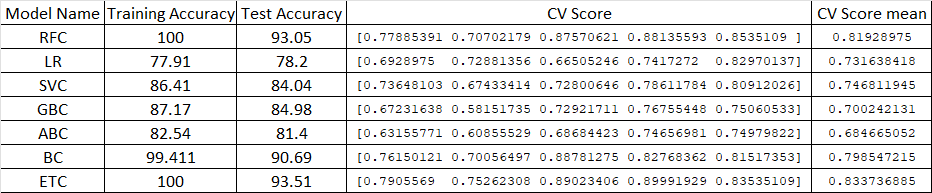

1. Random Forest Classifier (RFC) model training accuracy = 100%, it may be overfitting. However, the test accuracy of 93.05% and the CV score mean of 0.8193 suggest that the model is performing well and generalizing to some extent.
2. Logistic Regression (LR) reasonably fits the training data well, it is performing consistently accross all folds.
3. Support Vector Classifier (SVC) model is also showing good accuracy on both training and test data, its CV score is also consistent.
4. Gradient Boosting Classifier (GBC), AdaBoost Classifier (ABC) model performance is also good.
5. Bagging Classifier (BC) CV mean may be overfitting.
6. Extra Trees Classifier (ETC) model training accuracy is also 100% it may also be overfitting.

Support Vector Classifier (SVC) is our top performing model!

Hyperparameter tuning

In [76]:
#importing RandomizedseachCV for hyperparameter tuning
from sklearn.model_selection import RandomizedSearchCV

In [77]:
parameters = {
    'C':[1.0,1.5,2.0],
    'kernel':['linear','poly','rbf','sigmoid'],
    'degree':[2,3],
    'gamma':['scale','auto'],
    'coef0':[0.0,0.1,1.0],
    'shrinking':[True,False],
    'verbose':[True,False],
    'max_iter':[-1,1],
    'break_ties':[True,False],
    'random_state': [10, None],
}


In [78]:
rsv = RandomizedSearchCV(SVC(), parameters)
rsv.fit(x1_train, y1_train)
print(rsv.best_params_)

[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]{'verbose': False, 'shrinking': False, 'random_state': 10, 'probability': False, 'max_iter': -1, 'kernel': 'rbf', 'gamma': 'scale', 'degree': 3, 'coef0': 0.1, 'break_ties': True, 'C': 1.5}


In [84]:
Hyper_svc=SVC(C=1.5,break_ties=False,coef0=0.1,degree=3,gamma='scale',kernel='rbf',max_iter=-1,probability=True,random_state=10,shrinking=False,verbose=False)

In [85]:
model(Hyper_svc)

Training Accuracy Score:  88.0548829701372
Accuracy Score:  84.88027979553404
[[1571  293]
 [ 269 1584]]
              precision    recall  f1-score   support

           0       0.85      0.84      0.85      1864
           1       0.84      0.85      0.85      1853

    accuracy                           0.85      3717
   macro avg       0.85      0.85      0.85      3717
weighted avg       0.85      0.85      0.85      3717



# Accuracy after hyperparameter tuning of Support Vector Classifier is 84.88%

In [86]:
from sklearn.metrics import roc_curve,roc_auc_score
y1_pred_prob=Hyper_svc.predict_proba(x1_test)[:,1]
fpr,tpr,thersholds=roc_curve(y1_test,y1_pred_prob)
print('ROC Score',roc_auc_score(y1_test,Hyper_svc.predict(x1_test)))

ROC Score 0.8488205820974687


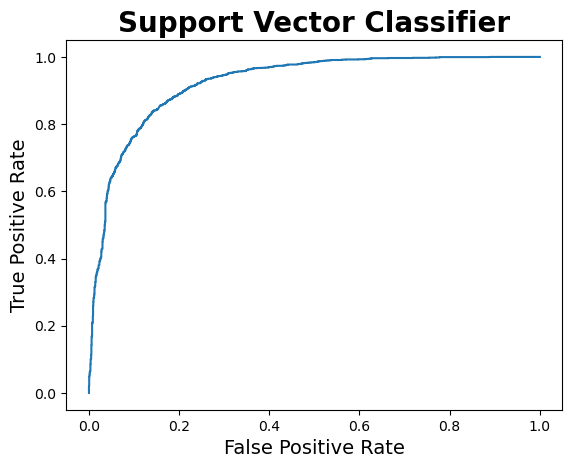

In [87]:
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate',fontsize=14)
plt.ylabel('True Positive Rate',fontsize=14)
plt.title('Support Vector Classifier',fontdict={'fontweight':'bold','fontsize':20})
plt.show()

In [88]:
Final_model=Hyper_svc

In [89]:
#Saving our model
import joblib
joblib.dump(Final_model,'Rainfall_tomorrow.pkl')

['Rainfall_tomorrow.pkl']

In [90]:
model=joblib.load('Rainfall_tomorrow.pkl')
Prediction=model.predict(x1_test)
Prediction

array([1, 1, 1, ..., 1, 0, 1])

In [91]:
Comparison=pd.DataFrame()
Comparison['True Value']=y1_test
Comparison['Prediciton']=Prediction
Comparison

,True Value,Prediciton
5700,0,1
7007,1,1
8636,1,1
1174,0,0
526,0,0
...,...,...
10486,1,1
2652,0,0
8517,1,1
6926,0,0


# Modeling 2 Rainfall prediction

In [92]:
#importing libraries
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

#importing models
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor,GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.linear_model import Lasso,Ridge
from sklearn.svm import SVR

In [93]:
maxAccu=0
maxRs=0
for i in range(1,200):
    x2_train,x2_test,y2_train,y2_test=train_test_split(x2,y2,test_size=0.20,random_state=i)
    lr=LinearRegression()
    lr.fit(x2_train,y2_train)
    pred=lr.predict(x2_test)
    acc=r2_score(y2_test,pred)
    if acc>maxAccu:
        maxAccu = acc
        maxRs = i
print(maxAccu, maxRs)

0.36748709021806336 85


In [94]:
x2_train,x2_test,y2_train,y2_test=train_test_split(x2,y2,test_size=0.20,random_state=i)
def model(m):
    m.fit(x2_train,y2_train)
    pred=m.predict(x2_test)
    print('R2 Score: ',r2_score(y2_test,pred)*100)
    print('R2 Score on training data: ',r2_score(y2_train,m.predict(x2_train))*100)
    print('MAE: ',mean_absolute_error(y2_test,pred))
    print('MSE: ',mean_squared_error(y2_test,pred))
    print('RMSE: ',np.sqrt(mean_squared_error(y2_test,pred)))

In [95]:
lr=LinearRegression()
model(lr)

R2 Score:  23.64071574477228
R2 Score on training data:  23.847182493499485
MAE:  3.1864980906364955
MSE:  85.30295847625692
RMSE:  9.23596007333601


In [96]:
rfr=RandomForestRegressor()
model(rfr)

R2 Score:  28.716102039619983
R2 Score on training data:  92.94669793423702
MAE:  2.086285103785104
MSE:  79.63311137667888
RMSE:  8.92373864345426


In [97]:
adr=AdaBoostRegressor()
model(adr)

R2 Score:  -77.36578758016289
R2 Score on training data:  29.47951351297332
MAE:  4.362649926804733
MSE:  198.1399715912531
RMSE:  14.076220074695234


In [98]:
gbr=GradientBoostingRegressor()
model(gbr)

R2 Score:  22.668754187987837
R2 Score on training data:  72.24699327653184
MAE:  2.4978965108918207
MSE:  86.38876221482751
RMSE:  9.294555514645523


In [99]:
dtr=DecisionTreeRegressor()
model(dtr)

R2 Score:  15.394137407738196
R2 Score on training data:  100.0
MAE:  2.0084859584859585
MSE:  94.51542735042736
RMSE:  9.721904512513346


In [100]:
model(KNN())

R2 Score:  12.082789206120282
R2 Score on training data:  55.05441339196494
MAE:  2.501562881562881
MSE:  98.21462124542124
RMSE:  9.910329018020605


In [101]:
model(Lasso())

R2 Score:  21.011681484563926
R2 Score on training data:  20.57109018607164
MAE:  2.666668480306869
MSE:  88.23992157797505
RMSE:  9.393610678433243


In [102]:
model(Ridge())

R2 Score:  23.640700972144757
R2 Score on training data:  23.847181723925726
MAE:  3.1862853155565753
MSE:  85.30297497914644
RMSE:  9.235960966740084


In [103]:
model(SVR())

R2 Score:  17.106056342874222
R2 Score on training data:  18.109060081281015
MAE:  2.100973276791734
MSE:  92.60299782384195
RMSE:  9.62304514298057


In [104]:
from sklearn.model_selection import cross_val_score

In [105]:
def scr(m):
    score=cross_val_score(m,x2,y2)
    print(score)
    print(score.mean())
    print('Diff b/w R2 score & CV score: ',(r2_score(y2_test,pred) - score.mean())*100)

In [106]:
scr(lr)

[0.1793842  0.20119061 0.27429158 0.22811503 0.34005493]
0.24460727167529686
Diff b/w R2 score & CV score:  -0.8200114227574079


In [107]:
scr(rfr)

[0.20463939 0.46473381 0.72554633 0.41435437 0.48871052]
0.45959688367890494
Diff b/w R2 score & CV score:  -22.318972623118217


In [108]:
scr(dtr)

[-0.12204017  0.16110997  0.56618042 -0.39400712 -0.10498127]
0.02125236676343225
Diff b/w R2 score & CV score:  21.515479068429052


In [109]:
scr(gbr)

[0.19707807 0.42779353 0.54481379 0.28201518 0.46540956]
0.38342202592826446
Diff b/w R2 score & CV score:  -14.701486848054168


In [110]:
scr(adr)

[-0.16989648 -0.43569095 -2.58442941 -5.20256946  0.3246959 ]
-1.6135780803226674
Diff b/w R2 score & CV score:  184.99852377703903


In [111]:
scr(KNN())

[0.144073   0.28076553 0.37175157 0.22873544 0.35607477]
0.27628006136474037
Diff b/w R2 score & CV score:  -3.987290391701759


In [112]:
scr(Lasso())

[0.14606289 0.17891069 0.23494323 0.27861547 0.31871315]
0.23144908565053807
Diff b/w R2 score & CV score:  0.49580717971847155


In [113]:
scr(Ridge())

[0.17937863 0.20119129 0.2742928  0.22814085 0.34006265]
0.24461324272224516
Diff b/w R2 score & CV score:  -0.8206085274522379


In [114]:
scr(SVR())

[0.1150131  0.14473616 0.17835686 0.22015842 0.2549866 ]
0.18265022942394657
Diff b/w R2 score & CV score:  5.375692802377621


# Random Forest Regressor is our best performing model!

Hyperparameter tuning

In [115]:
#importing RandomizedseachCV for hyperparameter tuning
from sklearn.model_selection import RandomizedSearchCV

In [116]:
parameters = {
    'ccp_alpha': [0.0, 0.01, 0.001],
    'warm_start': [True, False],
    'random_state': [10, 20],
    'oob_score': [True, False],
    'bootstrap': [True, False],
    'criterion': ['squared_error', 'absolute_error'],
    'n_jobs': [1],
    'n_estimators': [10, 20]
}

In [117]:
rsv = RandomizedSearchCV(RandomForestRegressor(),parameters,n_iter=10, n_jobs=-1)
rsv.fit(x2_train, y2_train)
print(rsv.best_params_)

{'warm_start': True, 'random_state': 10, 'oob_score': True, 'n_jobs': 1, 'n_estimators': 20, 'criterion': 'absolute_error', 'ccp_alpha': 0.001, 'bootstrap': True}


In [118]:
Hyper_rfr=RandomForestRegressor(warm_start=True,random_state=10,oob_score=True,n_jobs=1,n_estimators=10,criterion='absolute_error',ccp_alpha=0.001,bootstrap=True)

In [119]:
model(Hyper_rfr)

R2 Score:  25.752237542009237
R2 Score on training data:  81.42024391107687
MAE:  2.1629334554334556
MSE:  82.94412211538462
RMSE:  9.107366365496922


In [120]:
#Saving our model
import joblib
joblib.dump(Final_model,'Rainfall.pkl')

['Rainfall.pkl']